# Imports

In [1]:
%matplotlib inline

import numpy as np
import cv2 as cv2
from skimage import io # for io.imread
from matplotlib import pyplot as plt # ploting
from matplotlib import colors # ploting

# interactive notebook widgets
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

from google.colab.patches import cv2_imshow

# Utility Functions

In [2]:
# Util function to display an image on google colab
def imshow(images, titles, nrows = 0, ncols=0, figsize = (15,20)):
    """Plot a multiple images with titles.

    Parameters
    ----------
    images : image list
    titles : title list
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """

    if ncols == 0 and nrows == 0:
      ncols = len(images)
      nrows = 1
    if ncols == 0:
      ncols = len(images) // nrows
    if nrows == 0:
      nrows = len(images) // ncols

    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows, squeeze=False, figsize = figsize)
    for i, image in enumerate(images):
        axeslist.ravel()[i].imshow(image, cmap=plt.gray(), vmin=0, vmax=255)
        axeslist.ravel()[i].set_title(titles[i])
        axeslist.ravel()[i].set_axis_off()
    plt.tight_layout() # optional

# Here you may change the Input Image

In [3]:
imageName = "demoImg.jpg"

# Reading the Image

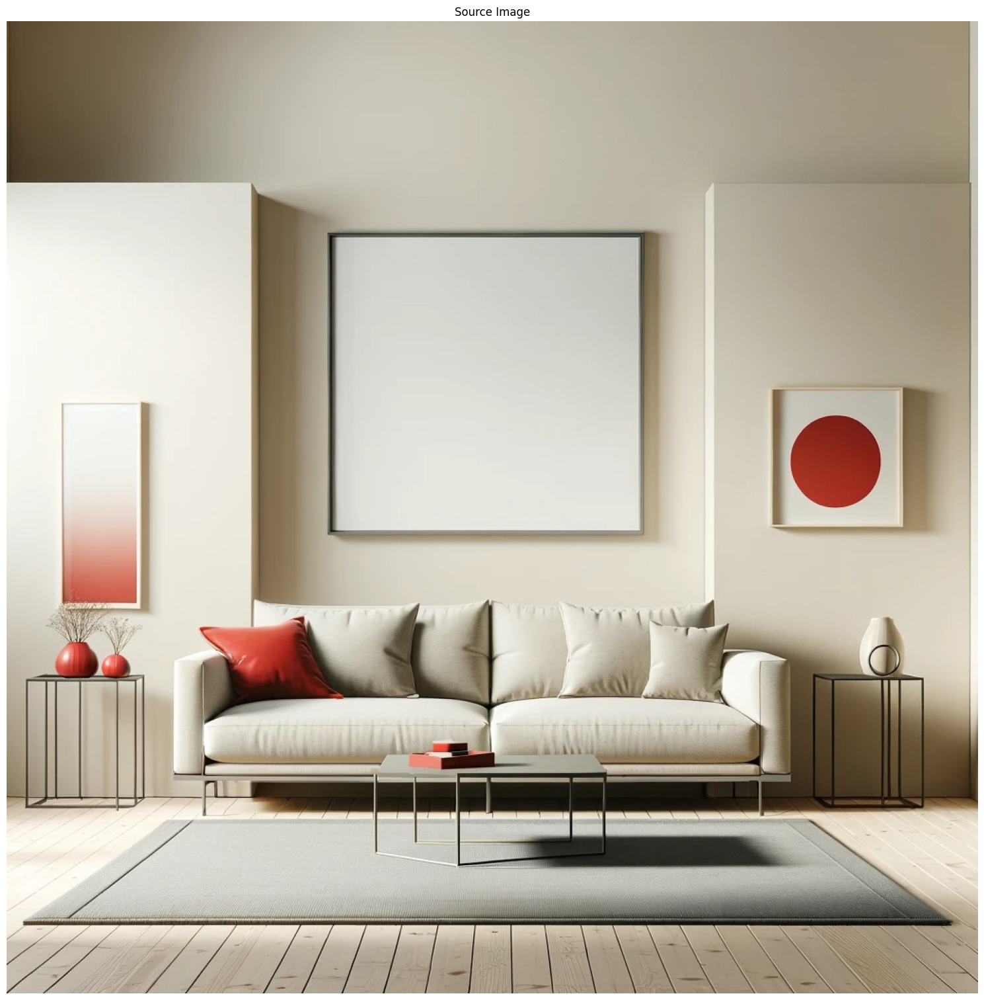

In [4]:
#Here the custom image is imported
image1 = io.imread(imageName)
image1 = np.array(image1,dtype='uint8')
imshow([image1], ['Source Image'])

# Horizontal Edge Detection & De-Noising

In [5]:
#To get the Horizontal Edges we need to use the Sobel Operator instead of the
# entire canny edge detector
def getHorizontalEdges(image,showFilter=False):

  img = image.copy()

  #Pre-Processing: applying a bi-lateral filter such that we don't consider
  #noise as much in the edge-finding (keeps sharp edges)
  img = cv2.bilateralFilter(img,9,75,75)
  if showFilter:
    imshow([img], ['Bilateral Filter'])

  #Need the image to be 1-dimensional, i.e. gray before applying the sobel operator
  imageGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gy_sobel_cv = cv2.Sobel(imageGray,cv2.CV_64F,0,1,3)/8
  #Scaling the values so they're more visible
  gy2_sobel_cv = gy_sobel_cv ** 2
  _, gy2_sobel_cv = cv2.threshold(gy2_sobel_cv, 100, 255, cv2.THRESH_BINARY)
  return gy2_sobel_cv

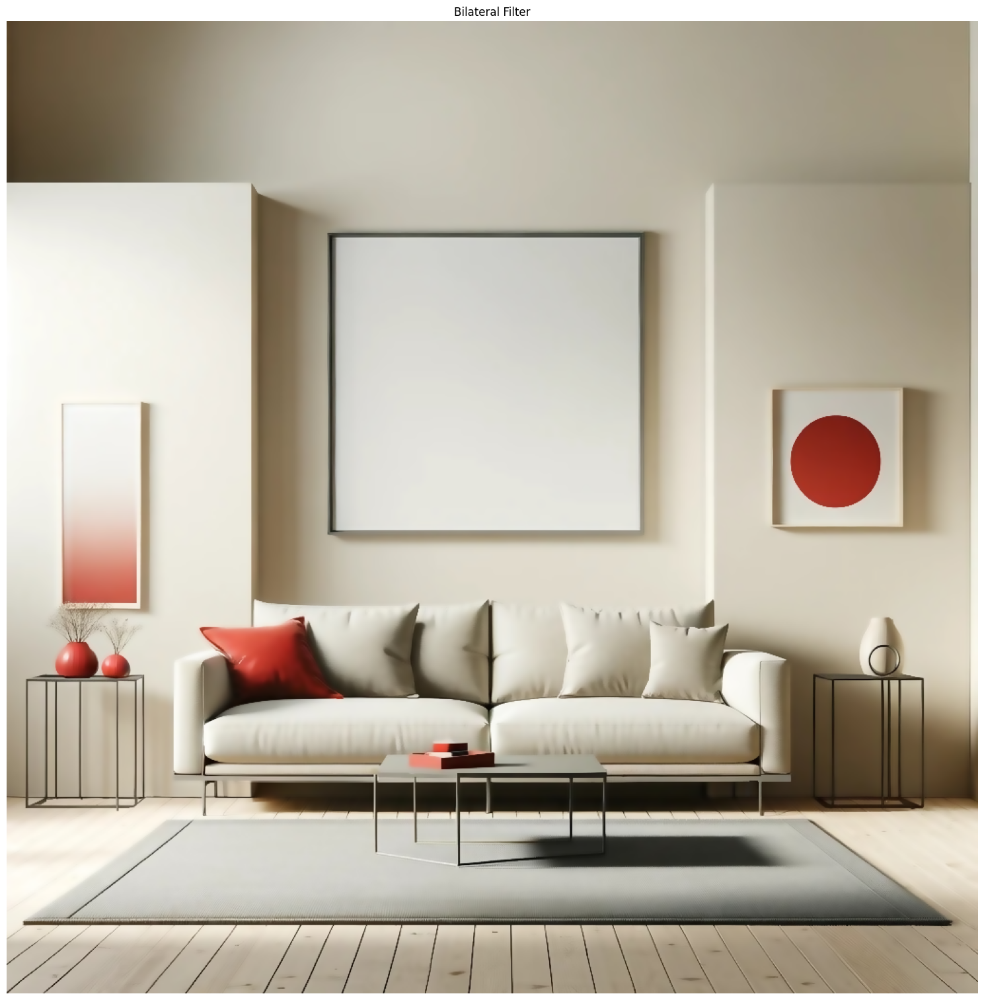

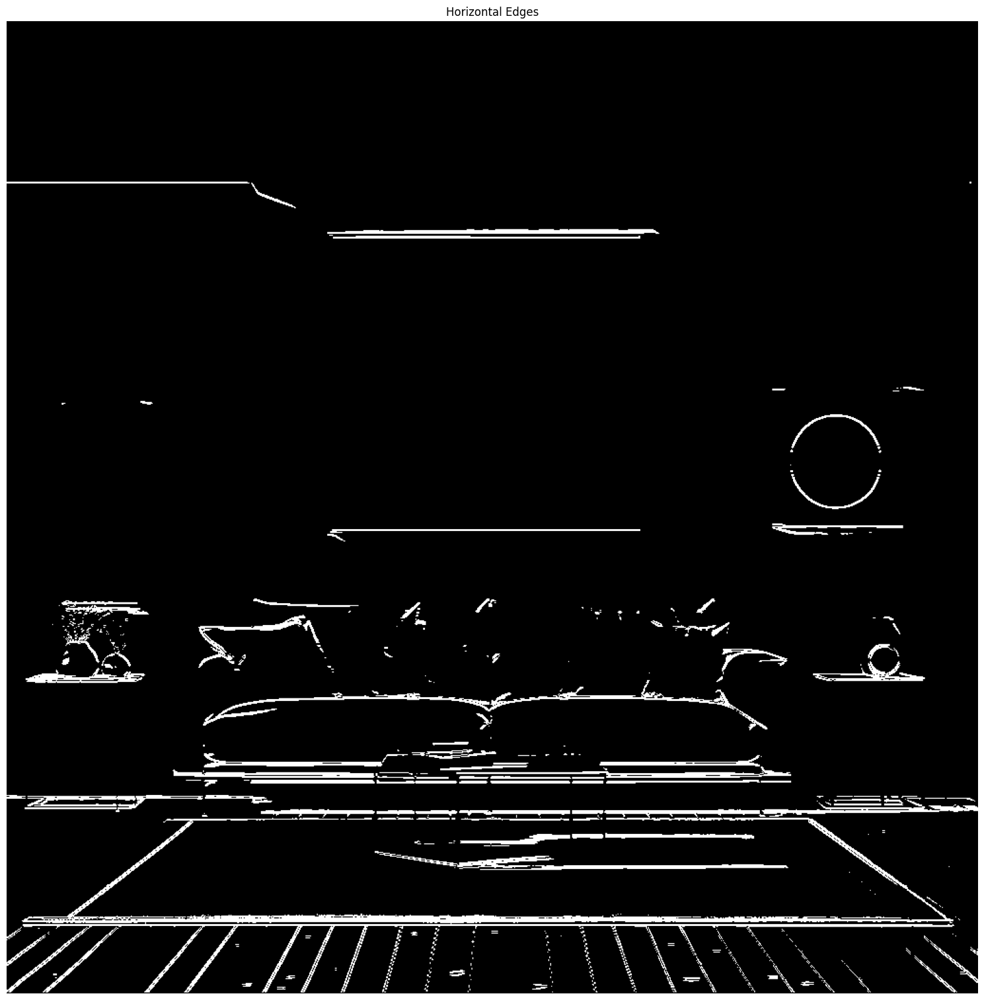

In [6]:
##Shows the edges from the Canny Edge Detector
def display_Edge(image):
  edgeImage = getHorizontalEdges(image,showFilter=True)
  imshow([edgeImage], ['Horizontal Edges'])
display_Edge(image1)

In [7]:
#For every point, it checks wether it is an interior point, i.e. both itself
#and it's horizontal neighbor pixels are edge pixels. If it's not an interior point, it gets removed
def removeExteriorPoints(image):
  #Copying to avoid changing the original image
  imageEdge = image.copy()
  newEdge = np.zeros_like(imageEdge)
  for x in range(1,imageEdge.shape[1]-1):
    for y in range(imageEdge.shape[0]):
      #255.0 is an edge pixel, 0.0 is not an edge pixel
      if ( (imageEdge[y,x-1] > 1) and (imageEdge[y,x+1] > 1) and (imageEdge[y,x] > 1)  ):
        newEdge[y,x] = 255.0
      else:
        newEdge[y,x] = 0.0

  return newEdge

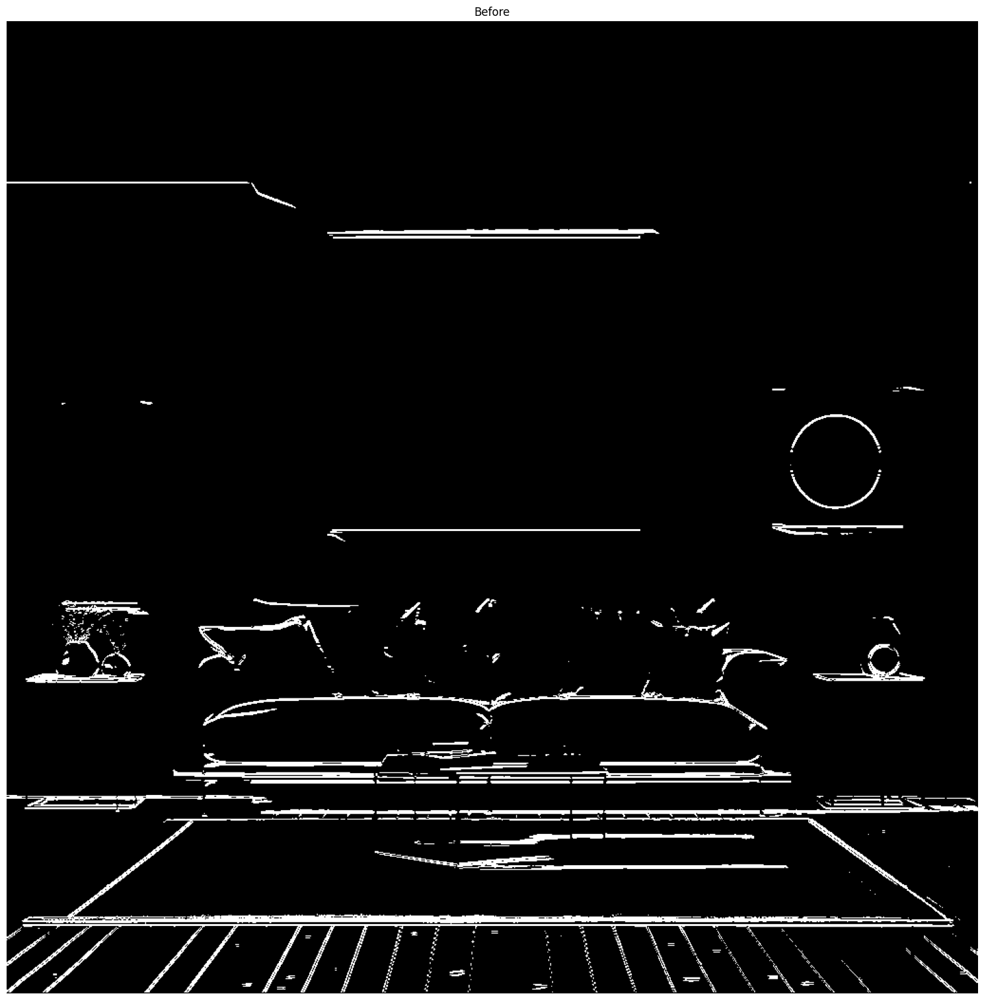

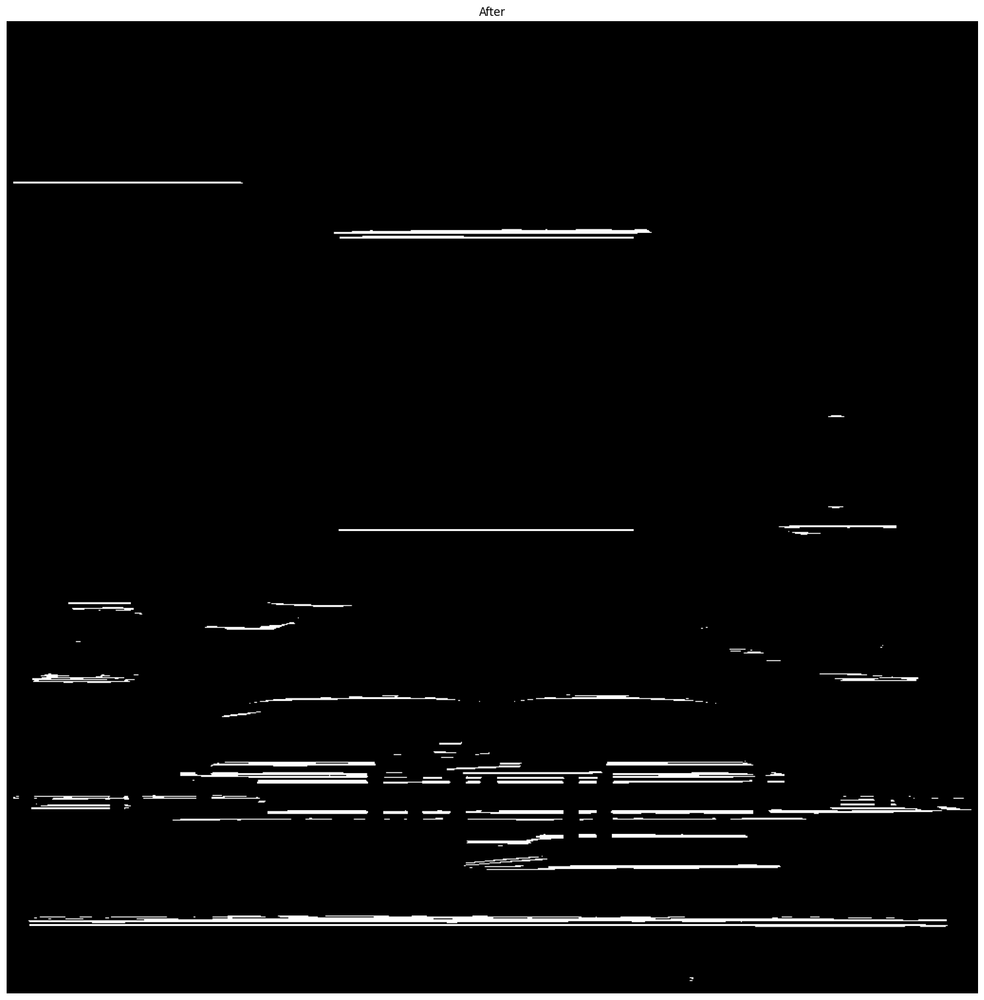

In [8]:
#Removes noise from the edges using our own technique by removing the endpoint.
#If we do this repeatedly, the small line segments wil dissapear
def deNoiseEdges(edgeImage,iters=7,showEdges=True):
  if showEdges:
    imshow([edgeImage], ['Before'])
  for i in range(iters):
    edgeImage = removeExteriorPoints(edgeImage)
  if showEdges:
    imshow([edgeImage], ['After'])
  return edgeImage


edgeImage = deNoiseEdges(getHorizontalEdges(image1))

In [9]:
###DEPRECATED - NO LONGER IN USE
#Used to lengthen the lines on the edge image to revert the changes of the De-Noising
def lengthenHorizontals(image):
  imageEdge = image.copy()
  newEdge = np.zeros_like(imageEdge)
  for x in range(1,imageEdge.shape[1]-1):
    for y in range(imageEdge.shape[0]):
      if (imageEdge[y,x] > 1):
        newEdge[y,x] = 255.0
        if (imageEdge[y,x-1] < 1):
          newEdge[y,x-1] = 255.0
        if (imageEdge[y,x+1] < 1):
          newEdge[y,x+1] = 255.0
  return newEdge

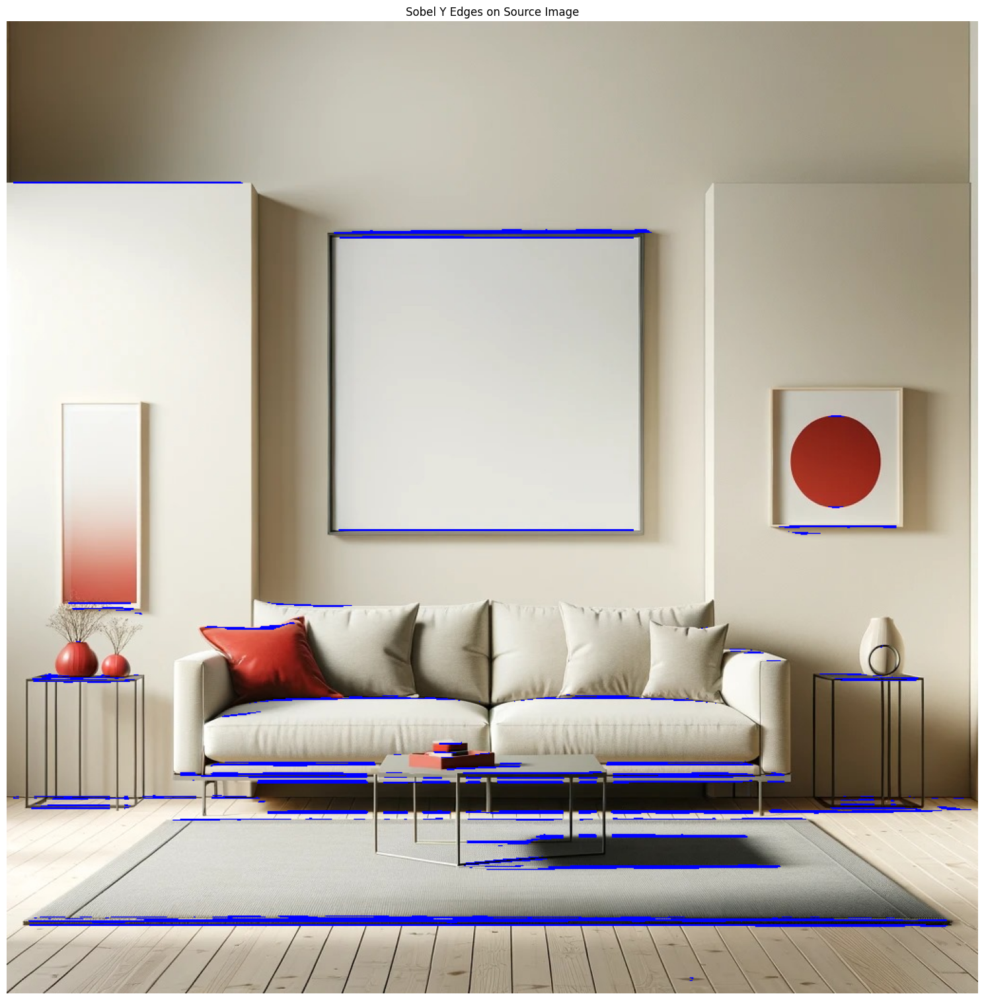

In [10]:
def showEdgeOnImage(realImage,imageEdge):
  showImage = realImage.copy()
  for x in range(imageEdge.shape[1]):
    for y in range(imageEdge.shape[0]):
      if imageEdge[y,x] == 255.0:
        showImage[y,x] = np.array([0.0,0.0,255.0])

  imshow([showImage], ['Sobel Y Edges on Source Image'])
showEdgeOnImage(image1,edgeImage)

# Hough Transform

this is the best angle: -0.0003566986407228451


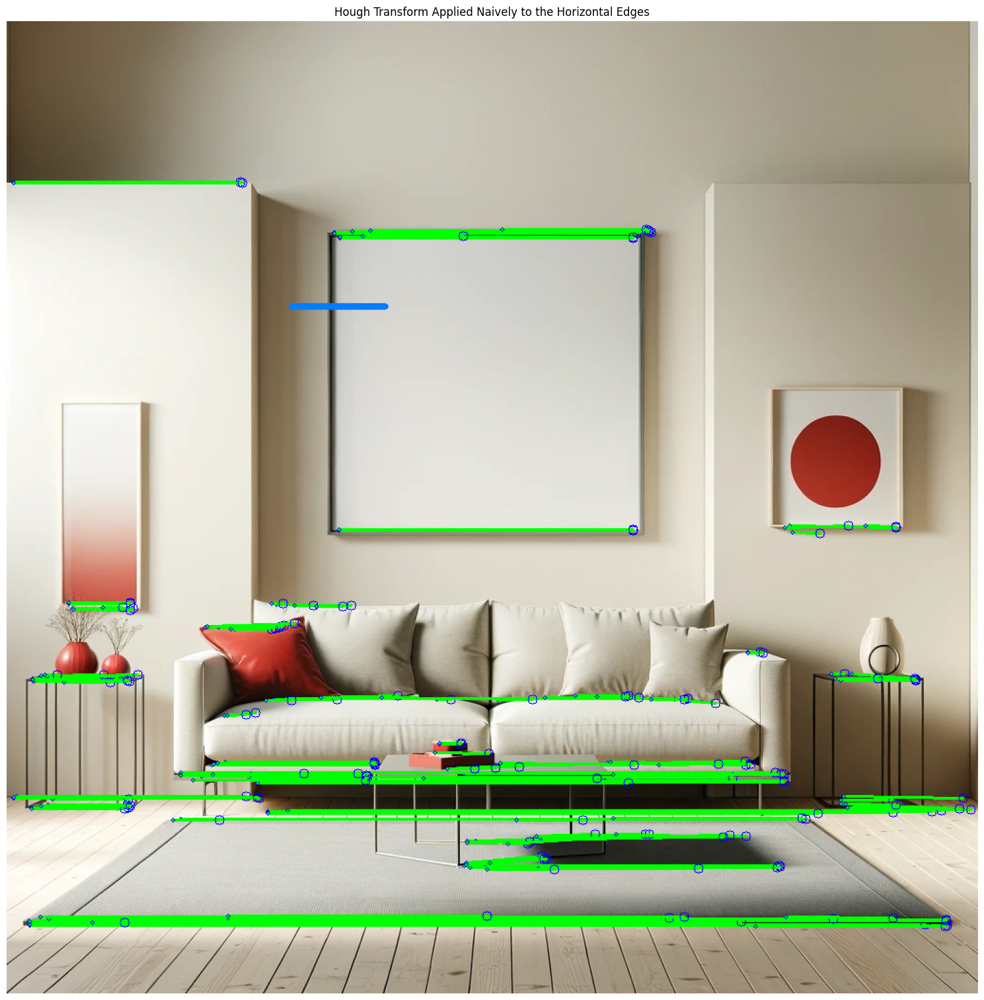

In [11]:
#First Hough Transform

#Hough Function Parameters
minLineLength = 100
maxLineGap = 400


def findEndPoints(image,edgeImage):
  #Formatting and retrieving the Horizontal Edges
  img = image.copy()
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  img = np.array(img,dtype='uint8')
  edgeImage = np.uint8(edgeImage)

  #OpenCV of the Probablistic Hough Transform
  lines = cv2.HoughLinesP(edgeImage, 1, np.pi / 180, 20, None, 10, 100)

  #These arrays will store the points and angles for the lines in the Hough Transfrom
  endPoints = np.zeros((len(lines),4))
  angleArray = np.zeros((len(lines),2))

  for idx,line in enumerate(lines):
    for x1,y1,x2,y2 in line:
      #Visualizing them on the source image
      cv2.line(img,(x1,y1),(x2,y2),(0,255,0),2)
      cv2.circle(img, (x1,y1), 2, color=(0,0,255))
      cv2.circle(img, (x2,y2), 5, color=(0,0,255))
      endPoints[idx,:] = [x1, y1, x2, y2]

      #For each line we collect its angle and distance
      distance = np.sqrt((x2-x1)**2 + (y2-y1)**2)
      angle = np.arctan2((y2 - y1) , (x2 - x1))
      angleArray[idx,:] = [angle,distance**2]

  #Finding the best orientation such from the mean of the angle such
  #that most of the lines lie along the horizontal
  #using the distances to weight which angles we should use more
  bestAngle = np.average(angleArray[:,0], weights=angleArray[:,1])
  print(f"this is the best angle: {bestAngle}")
  #Showing this orientation on the source image
  cv2.line(img, (300,300), (300 + int(np.cos(bestAngle)*100), 300 + int(np.sin(bestAngle)*100)),(0,125,255),5)

  #Storing the Coordinates in a text file
  #Because we will run this function later on again, the text file gets overwritten
  #so it only saves the last coordinates luckily
  with open('coords.txt', 'w') as f:
    for line in endPoints:
      f.write(f'{line[0]} {line[1]} {line[2]} {line[3]} \n')

  imshow([img], ['Hough Transform Applied Naively to the Horizontal Edges'])
  return bestAngle,lines

###The Big Blue Line is for the best Orientation
bestAngle,lines = findEndPoints(image1,edgeImage)

# Rotating the Image to Align with the Horizon

True

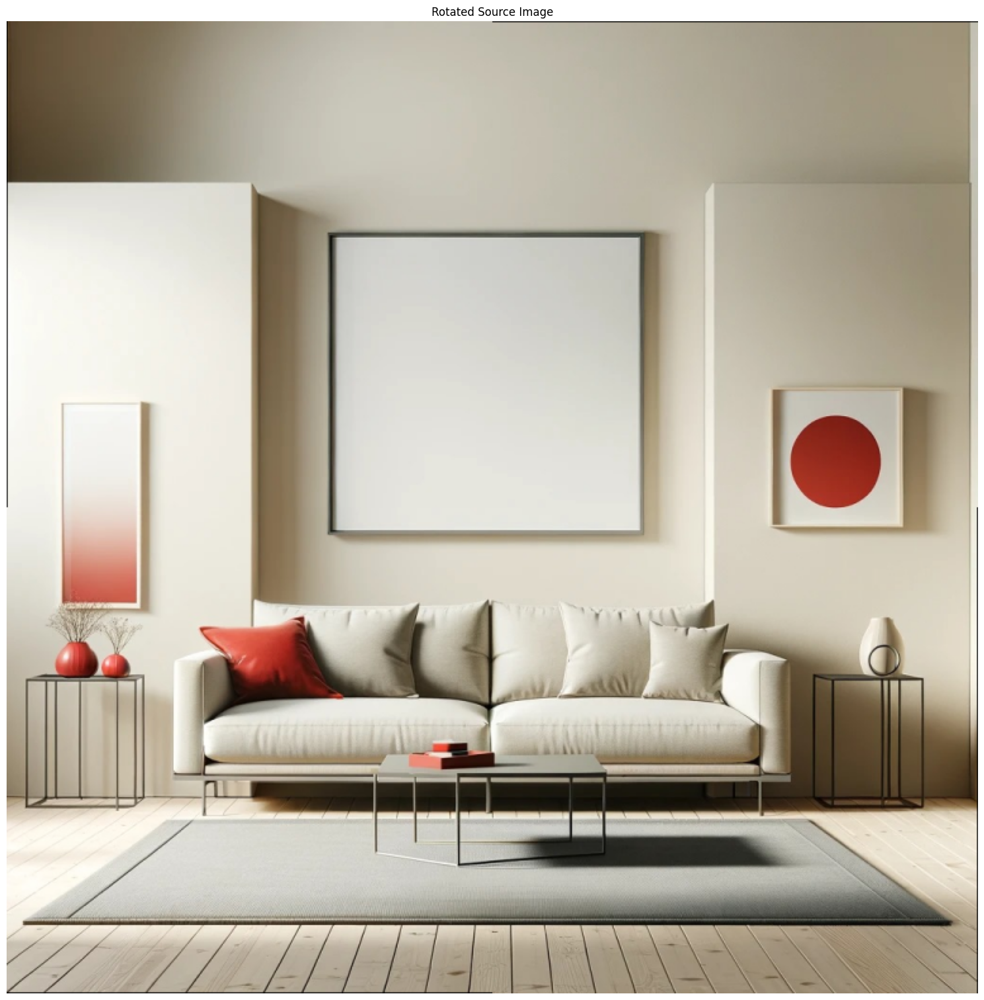

In [12]:
from scipy import ndimage

#rotating the image by bestAngle in radians
rotated = ndimage.rotate(image1, bestAngle * (180/3.14))

#Resizing it so that we always have a fixed height, but the same aspect ratio
imageHeight = rotated.shape[0]
ratioHeight = imageHeight / 768
rotated = cv2.resize(rotated, (int(rotated.shape[1]/ratioHeight),768), interpolation = cv2.INTER_AREA)

#Correct size for the godot background
imshow([rotated], ['Rotated Source Image'])
cv2.imwrite('demoImgRot.jpg',cv2.cvtColor(rotated,cv2.COLOR_BGR2RGB))

# Second Hough Transform

this is the best angle: 0.0001164237926902973


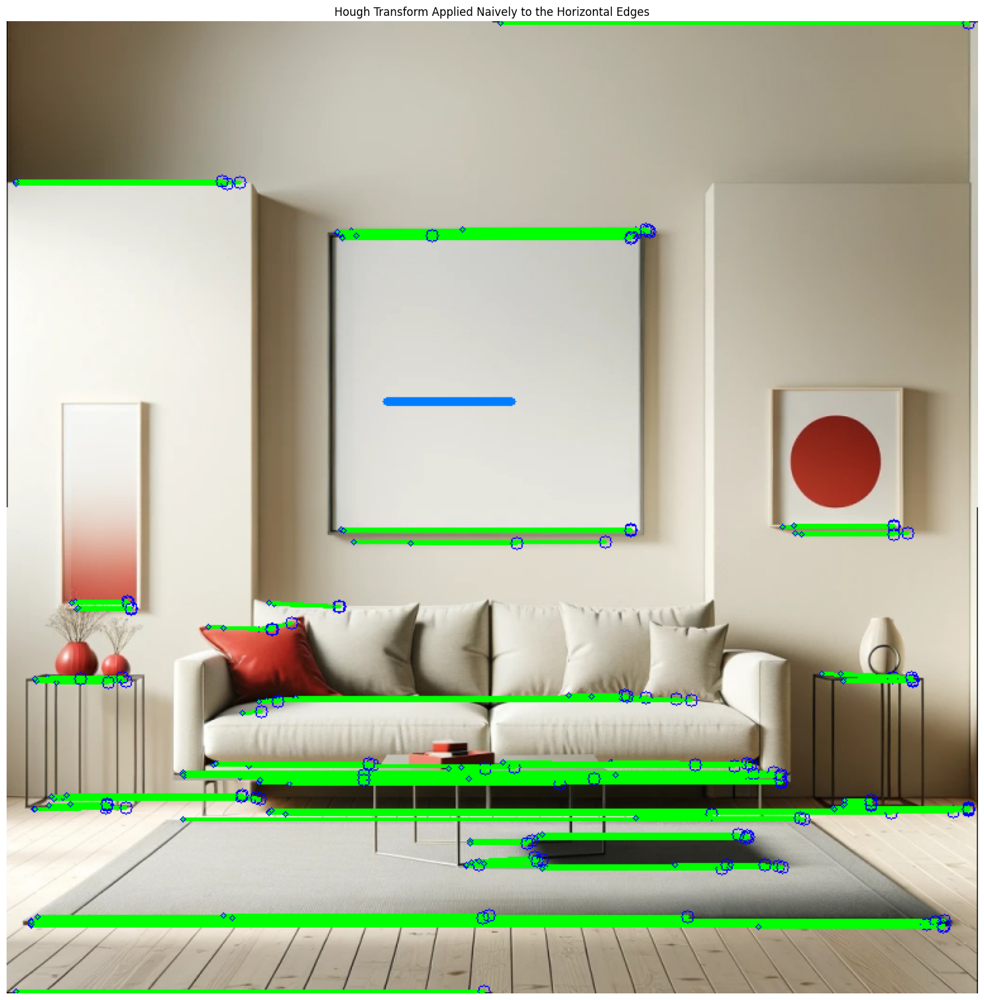

In [13]:
#Apply the Hough Transfrom again but now on the rotationally aligned image
rotatedEdges = deNoiseEdges(getHorizontalEdges(rotated),showEdges=False)
bestAngle,lines = findEndPoints(rotated,rotatedEdges)

# Defining Smooth Candidate Pixels

In [14]:
#We made our own convolution function where we have access to the matrix directly,
#such that we can define non-linear kernel mappings

#We want to select lines that at least above, or below it, have a smooth surface
#we can think of smoothness as the lack of edges, i.e. the black spaces in the
#Canny Edges image
def customConvolution(image, kerExt):
  #Formatting
  img = image.copy()
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

  #Using the Canny Edge detector to look for edges (both vertical and horizontal)
  img = cv2.Canny(gray,5,150,apertureSize = 3)
  imshow([img], ['Canny Edges'])

  #Padding so that the convolution works properly
  srcImg = np.pad(img, kerExt)
  newImg = np.zeros_like(img,dtype='uint8')

  #For every Pixel, we look at the extended windows facing above and below it to see
  #how many edges are in its vicinity. We do this by maxing over all the edge values
  #in the canny edge image. A surface that is smooth will have a low sum.
  for x in range(img.shape[1]):
    for y in range(img.shape[0]):
      #Top Window
      topMatrix = srcImg[y+1:y+kerExt+1,x-kerExt:x+kerExt+1]
      #Bottom Window
      bottomMatrix = srcImg[y-kerExt:y-1,x-kerExt:x+kerExt+1]

      #Taking the minimum, we only need one side to be smooth
      newImg[y,x] = min(np.sum(topMatrix),np.sum(bottomMatrix))
  return newImg

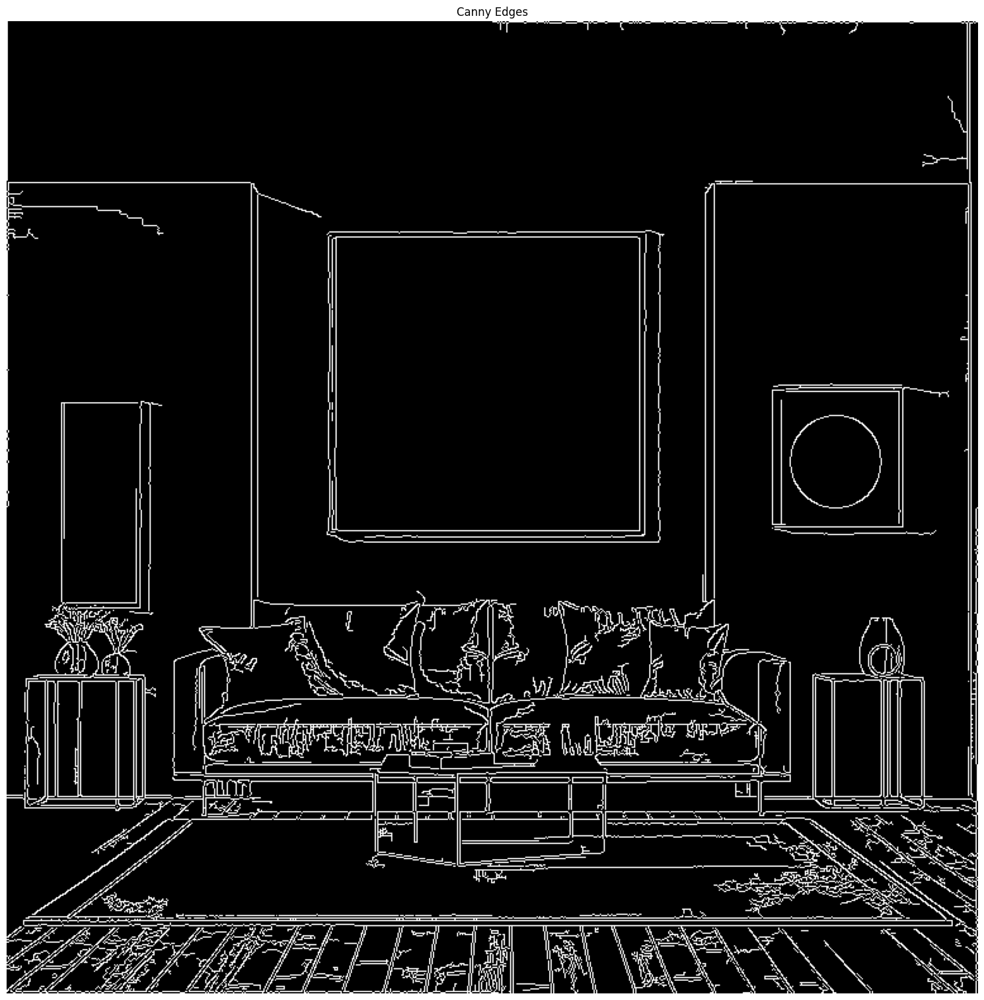

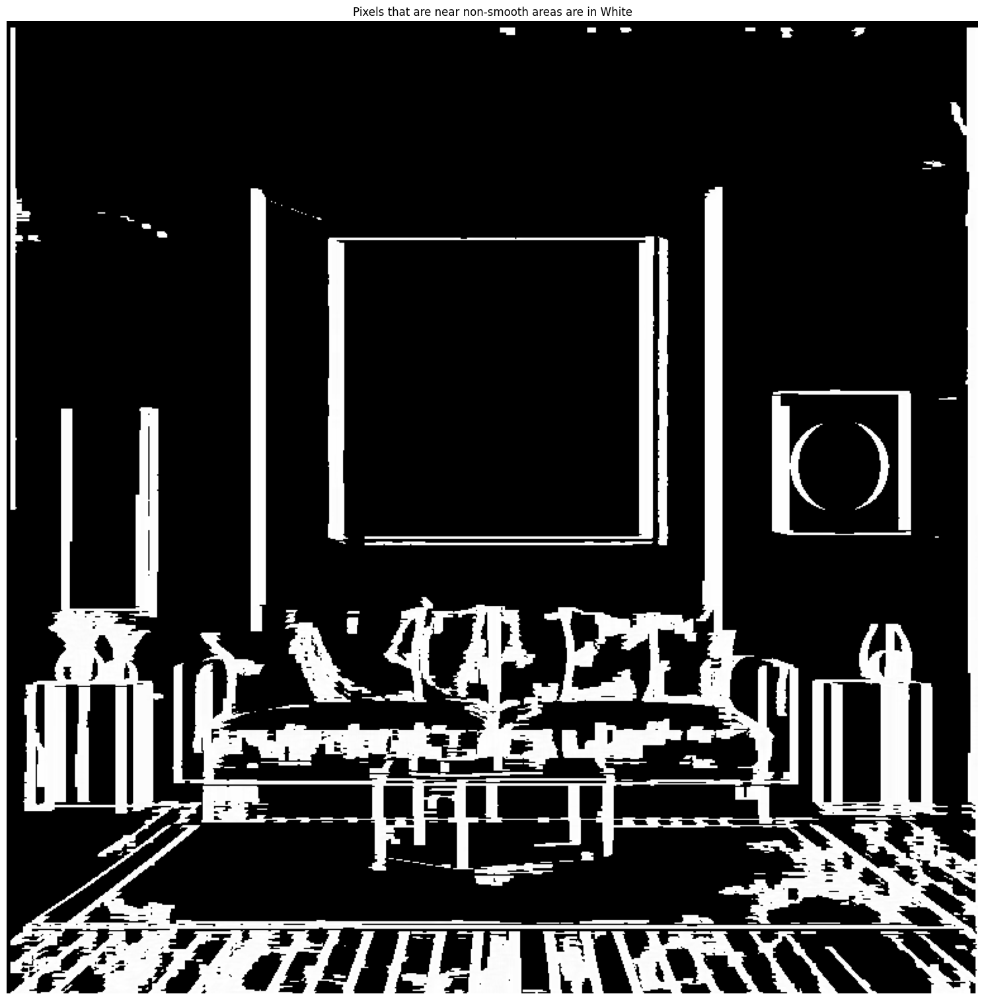

In [15]:
#This might take a couple minutes to run if the image is really big
smoothImage = customConvolution(rotated,kerExt=3)
imshow([smoothImage], ['Pixels that are near non-smooth areas are in White'])

# K-Means to Cluster the Lines by Position

In [16]:
from sklearn.cluster import KMeans
def kMeansLines(lines,n_clusters=30):
  lineX = np.zeros((len(lines),2))
  for idx,line in enumerate(lines):
    for x1,y1,x2,y2 in line:
      ### PARTLY DEPRECATED
      #we used to also use the slope an intercept as variables
      #it turns out the position just works better
      #m = (y2-y1)/(x2-x1)
      #b = y1 - m*x1
      #lineX[idx,:] = [m,b,(x2+x1)/2,(y2+y1)/2]
      lineX[idx,:] = [(x2+x1)/2,(y2+y1)/2]
  kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init="auto").fit(lineX)
  return(kmeans.labels_)

color_labels = kMeansLines(lines)

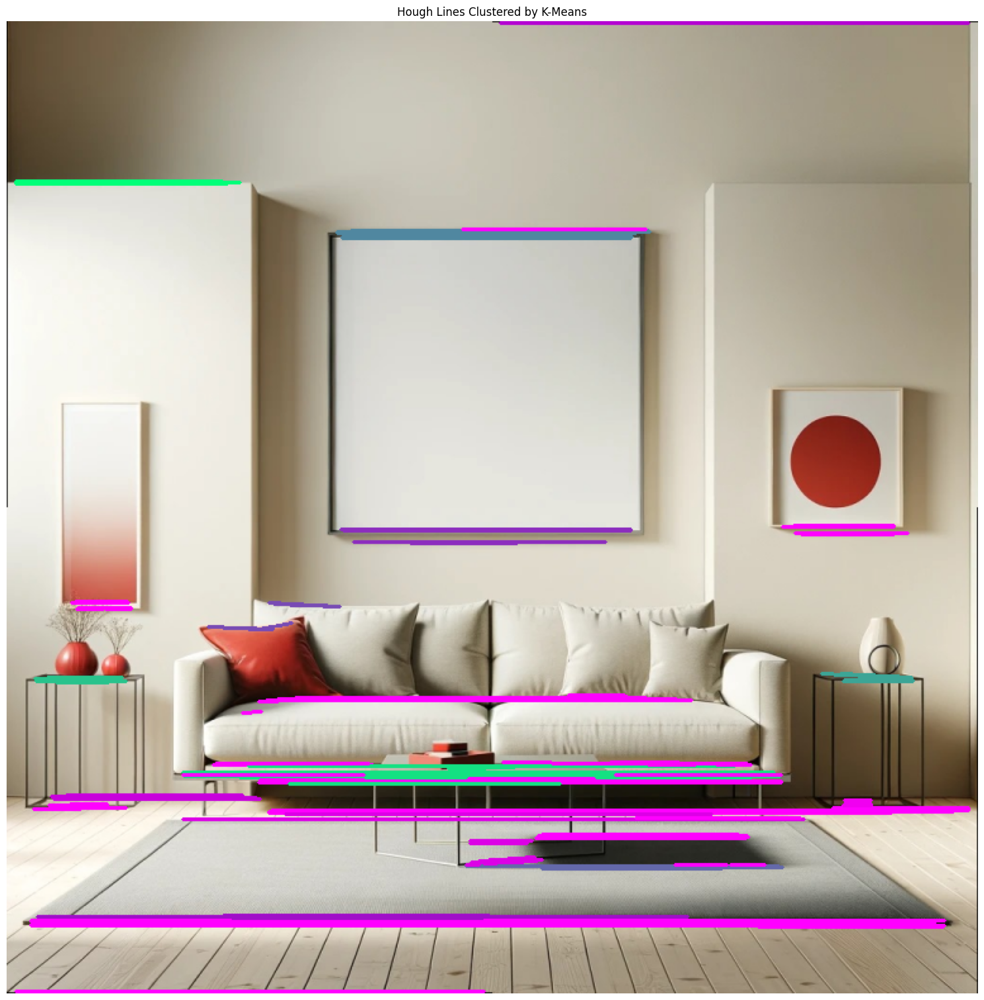

In [17]:
kMeanImg = rotated.copy()
for idx,line in enumerate(lines):
  for x1,y1,x2,y2 in line:
    cv2.line(kMeanImg,(x1,y1),(x2,y2), (int(color_labels[idx]*20),255 - int(color_labels[idx]*30),120+int(color_labels[idx]*10)) ,2)
imshow([kMeanImg], ['Hough Lines Clustered by K-Means'])


In [18]:
#Sampling points on the line
def pointsOnLine(line, num_samples=20):
  for x1,y1,x2,y2 in line:
    xPoints = np.linspace(x1, x2, num=num_samples)
    yPoints = np.linspace(y1, y2, num=num_samples)

    pointsLine = np.zeros((num_samples,2),dtype='uint')
    for idx,xy in enumerate(zip(xPoints,yPoints)):
      x = xy[0]
      y = xy[1]
      #Returning the pixel value
      pointsLine[idx,:] = [int(round(y)),int(round(x))]
    return pointsLine

In [19]:
#Selecting the line that is least adjacent to non-smooth areas
def bestLines(smoothAreas,lines,color_labels):

  bestLines = np.zeros((max(color_labels)+1,1,4))

  #Finding the best line for each cluster
  for label in range(max(color_labels)+1):
    labelLines = lines[color_labels==label]

    #A very large value to start off the initializer
    bestSmoothness = 10000

    #Finding the line with the minimal custom kernel value
    for idx,line in enumerate(labelLines):
      pointsToCheck = pointsOnLine(line)

      smoothnessSum = 0
      for coord in pointsToCheck:
        smoothnessSum += smoothAreas[int(coord[0]),int(coord[1])]
      if smoothnessSum < bestSmoothness:
        bestSmoothness = smoothnessSum
        bestLine = idx

    #Saving only the best line
    bestLines[label,:,:] = labelLines[bestLine]

  return bestLines

best_lines = bestLines(smoothImage,lines,color_labels)

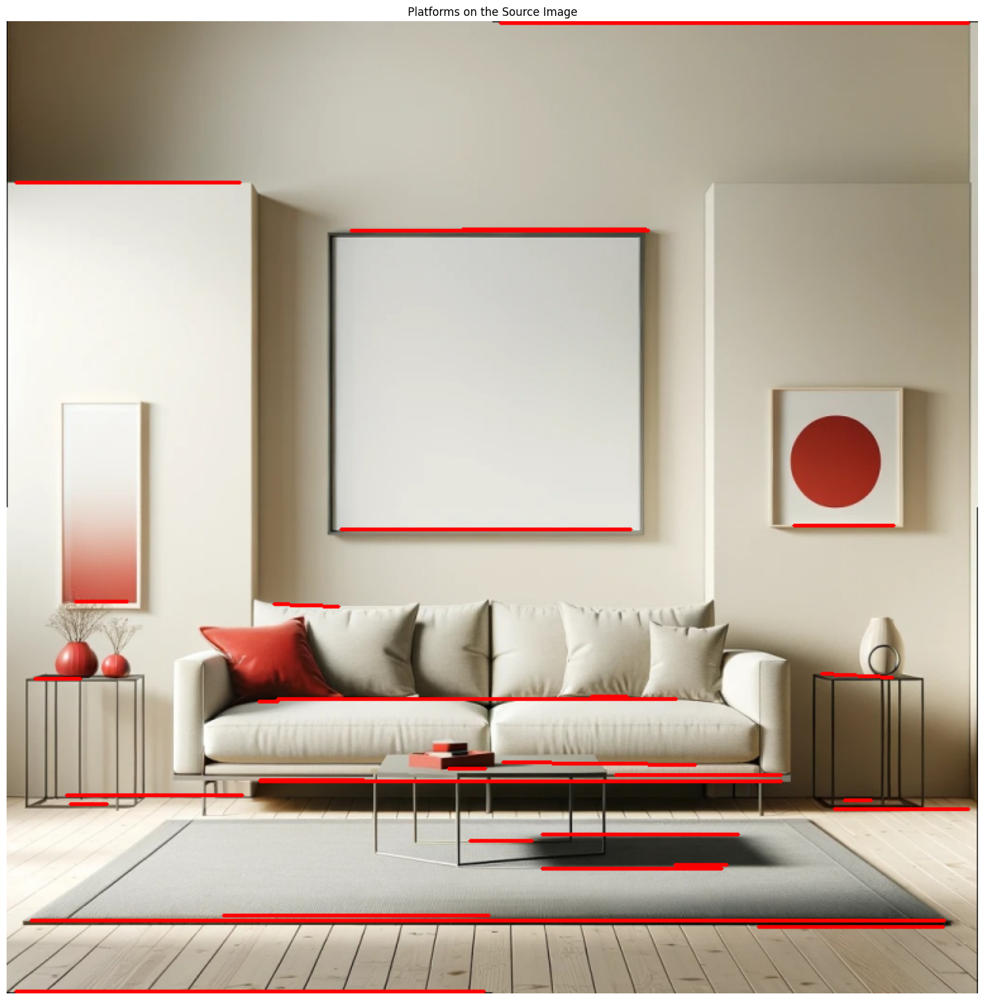

In [20]:
#Function to show our lines on an image
def showLinesOnImage(image,lines):
  img = image.copy()
  for line in lines:
    for x1,y1,x2,y2 in line:
      cv2.line(img,(int(x1),int(y1)),(int(x2),int(y2)), (255,0,0) ,2)
  imshow([img], ['Platforms on the Source Image'])
showLinesOnImage(rotated,best_lines)

# Ray Digging

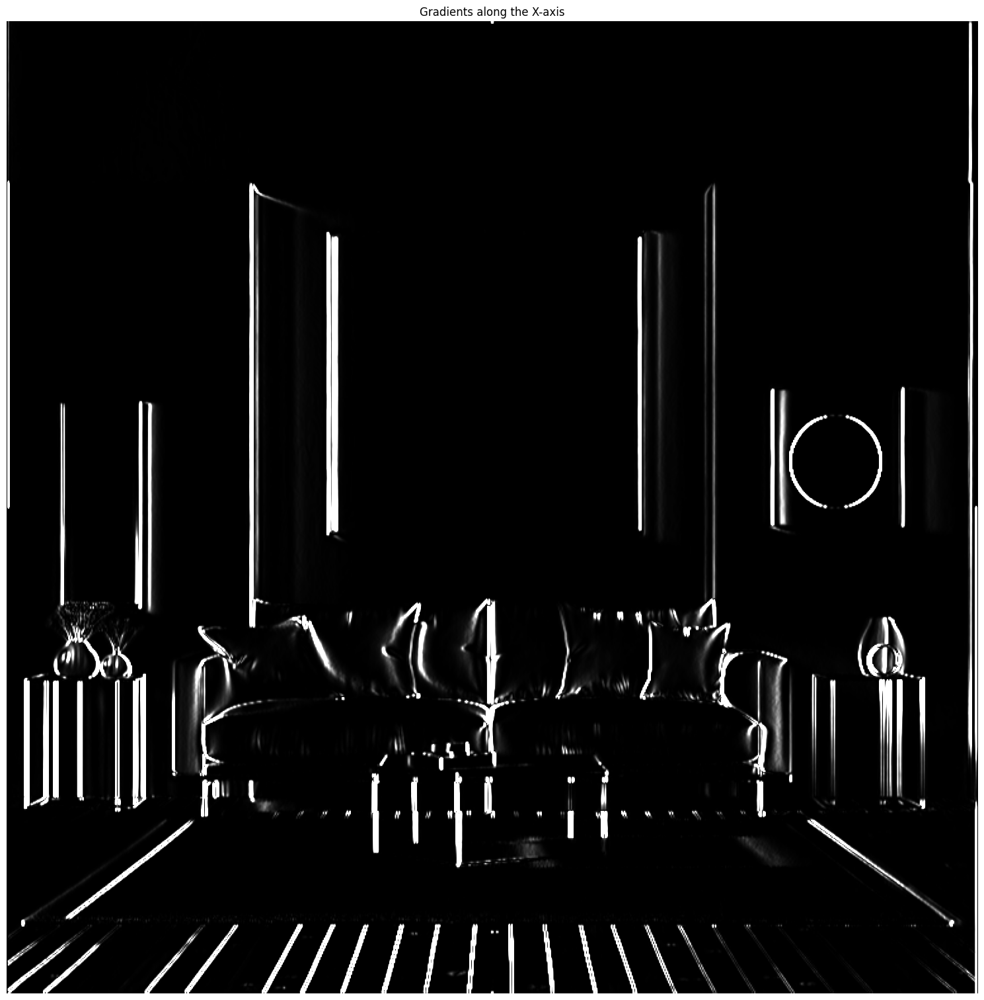

In [21]:
#We need to have the vertical edges to know when to stop extending the line
def verticalEdges(image):
  img = image.copy()
  #Pre-Processing: applying a bi-lateral filter
  img = cv2.bilateralFilter(img,9,75,75)
  imageGray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gx_sobel_cv = cv2.Sobel(imageGray,cv2.CV_64F,1,0,3)/8
  gx_sobel_cv = gx_sobel_cv ** 2
  imshow([gx_sobel_cv], ['Gradients along the X-axis'])
  return gx_sobel_cv
vEdges = verticalEdges(rotated)

In [22]:
### Ray-Digging: an original technique for extending lines along an edge
#essentially we take the endpoints of a line and keep extending them
#until we find a vertical edge, which hints that we should stop 'digging' further

def rayDigging(source,verticalEdges,lines,lookAhead=7):
  rayExtendedLines = np.zeros((len(lines),1,4))
  for idx,line in enumerate(lines):
    for x1,y1,x2,y2 in line:
      ### DEPRECATED: Distribution-based stopping
      """
      #we want to know the average of the vertical distribution values around a point
      points = pointsOnLine(line)
      avgVerticalSlice = np.zeros((lookAhead*2+1,3))
      for point in points:
        x = int(point[0])
        y = int(point[1])
        #try:
        #avgVerticalSlice += source[y-lookAhead:y+lookAhead+1,x,:]
        #except

      #This is what the average distribution of points looks like
      #avgVerticalSlice /= len(points)

      #print(avgVerticalSlice)

      #print(idx)
      """
      #Extending the Right Side
      keepExtending = True
      extendRightX = int(x2)
      extendRightY = int(y2)

      slope = (y2-y1)/(x2-x1)

      #Making sure we aren't violating boundary conditions
      while extendRightX < source.shape[0] and keepExtending and extendRightY < source.shape[1] and extendRightY > 0:
        #Looking in a vertical slice to see if we see any vertical edges
        newSlice = verticalEdges[extendRightY-lookAhead:extendRightY+lookAhead+1,extendRightX]

        #We need a try statement in case something goes wrong at the image boundaries
        try:
          if np.sum(newSlice) < 30:
            #If we don't see an edge we can continue digging
            extendRightX += 2
            extendRightY = int(y2 + slope*(extendRightX - x2))
          else:
            #Otherwise, we stop digging
            keepExtending = False
        except:
            keepExtending = False

      #Extending the Left Side
      keepExtending = True
      extendLeftX = int(x1)
      extendLeftY = int(y1)

      while extendLeftX > 0 and keepExtending and extendLeftY < source.shape[1] and extendRightY > 0:
        try:
          newSlice = verticalEdges[extendLeftY-lookAhead:extendLeftY+lookAhead+1,extendLeftX]
          if np.sum(newSlice) < 30:
            extendLeftX -= 2
            extendRightY = int(y1 - slope*(x1 - extendLeftX))
          else:
            keepExtending = False
        except:
          keepExtending = False

      #Saving the extended platforms
      rayExtendedLines[idx,:,:] = [extendLeftX,extendLeftY,extendRightX,extendRightY]
  return rayExtendedLines

ray_lines = rayDigging(rotated,vEdges,best_lines)

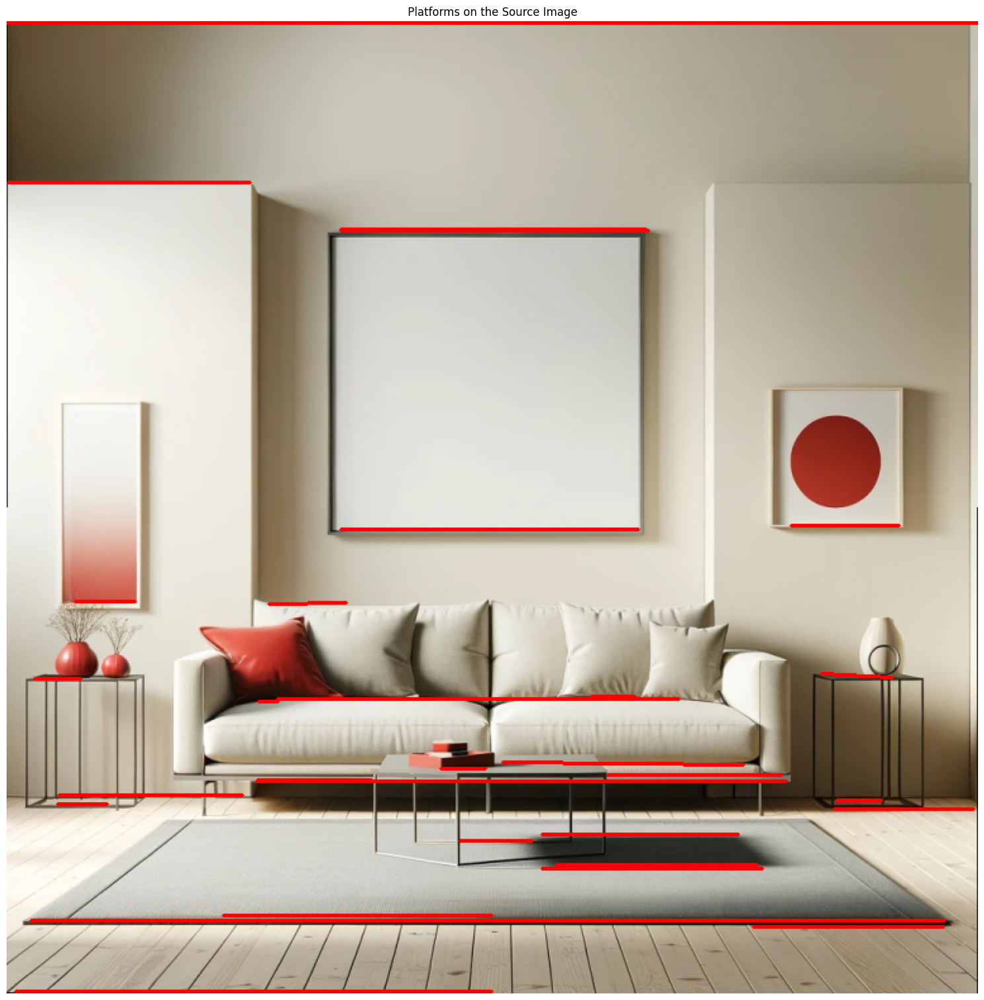

In [23]:
showLinesOnImage(rotated,ray_lines)

In [24]:
#saving the best lines
with open('coords_b.txt', 'w') as f:
    for line in ray_lines:
      #print(line)
      f.write(f'{line[0][0]} {line[0][1]} {line[0][2]} {line[0][3]} \n')